##  Classifying audio data with convolutional neural networks

<br/>
by Eduardo Garcia Rajo<br/>
<br/>

This notebook is part of the project "Urban sounds classification with Covnolutional Neural Networks" on [my Github](https://github.com/GorillaBus/urban-audio-classifier).<br/>
<br/>
Licensed under the GNU LESSER GENERAL PUBLIC LICENSE Version 3, 29 June 2007<br/>
<br/>

# Data Analysis 
<br/>

In this first notebook I will explore how the data is distributed in means of digital audio properties (sample rate, bit depth, duration, etc) and dataset categories. I will also analyze the convenience (or inconvenience) of filtering the dataset and working with converted audio files.<br/>
<br/>
Please make sure you have download the UrbanSound8K dataset from: https://urbansounddataset.weebly.com/urbansound8k.html.<br/>
<br/>
Also Visit the project home on Github for references, requirements, notes and to follow the project adequately.<br/>
<br/>
This work assumes the reader has a at least some understanding of the basics of digital audio and signal processing, but if in doubt check the references section in the project's Github page to find guides and articles related to the subject.<br/>
<br/>
Let's get started!<br/>
<br/>

INDEX

1. The dataset: UrbanSound8K
2. Researches
3. Exploring the data
4. Listening to the data
5. Conclusions
6. Next

<br/>

### 1. The dataset: UrbanSound8K

<br/>
The UrbanSound8K dataset contains 8732 labeled sound slices of varying duration up to 4 seconds. The categorization labels are:

* Air Conditioner
* Car Horn
* Children Playing
* Dog bark
* Drilling
* Engine Idling
* Gun Shot
* Jackhammer
* Siren
* Street Music

Note that the dataset comes already organized in 10 validation folds. In the case we want to compare our results with other we should stick with this schema for validation (using a 10-fold validation).

<br/>

#### 1.1 Dataset metadata

The included metadata file ("UrbanSound8K/metadata/metadata.csv") provides all the required information about each audio file:

* slice_file_name: The name of the audio file.
* fsID: The Freesound ID of the recording from which this excerpt (slice) is taken
* start: The start time of the slice in the original Freesound recording
* end: The end time of slice in the original Freesound recording
* salience: A (subjective) salience rating of the sound. 1 = foreground, 2 = background.
* fold: The fold number (1-10) to which this file has been allocated.
* classID: A numeric identifier of the sound class.
* class: The class label name.


#### 1.2 Digital audio properties

The main features that describe digital audio -which we want to analyze on this notebook- are:

* Channels: number of audio channels (mono/stereo).
* Sample Rate: samples per second expressed in kilohertz (kHz); related to audio quality.
* Bit Depth: equal to resolution in images, describes level of detail. 
* Duration: length of the sound over time.

Data of different audio properties will also have different shape or structure. Our first task is to determine how are this different audio properties distributed among the dataset and evaluate how we may normalize them, for example, by conversion.<br/>
<br/>

#### * Setup
Pay attention to the very simple path variables configured in this section.

In [1]:
# Required libraries
import os
import pandas as pd
import IPython as IP
import struct
import matplotlib.pyplot as plt
import numpy as np
from include import helpers

# Set your path to the original dataset
us8k_path = os.path.abspath('./UrbanSound8K' )

# Global settings
metadata_path = os.path.join(us8k_path, 'metadata/UrbanSound8K.csv')
audio_path = os.path.join(us8k_path, 'audio')


## 2. Researches

Id like to start out by making a small brief of previous researches on the use of neural network models for this particular dataset. There are many interesting papers that helped me to figure out how to work with the dataset, each of which have achieved different results, improving from time to time as new approaches and methodologies were developed.<br/>
<br/>


#### 2.1 Score reference with UrbanSound8K

| PAPER AUTHOR | DATE | FEATURES | ACCURACY |
| --- | --- | --- | --- |
| Piczak | Sep 2015 | Log-Mel | 72.7% |
Zhang X. | Aug. 2017 | Mel | 81.9% |
Zhang Z. | Aug 2018 | LM-GS | 83.7% |
Sajjad Abdoli | Apr, 2019 | Raw Data-LM | 89.0% |
Li | June 2018 | Raw Data-LM | 92.2% |
Boddapati | Sep, 2017 | Spec-MFCC-CRP | 93% |
TSCNN-DS | Apr, 2019 | MFCC and LMC | 97.2% |

<br/>

#### 2.2 Paper references

[Environmental sound classification with convolutional neural networks](https://ieeexplore.ieee.org/abstract/document/7324337), Karol J. Piczak

[Dilated convolution neural network with LeakyReLU for environmental sound classification](https://ieeexplore.ieee.org/abstract/document/8096153),  Xiaohu Zhang ; Yuexian Zou ; Wei Shi.

[Deep Convolutional Neural Network with Mixup for Environmental Sound Classification](https://arxiv.org/abs/1808.08405), Zhichao Zhang, Shugong Xu, Shan Cao, Shunqing Zhang

[End-to-End Environmental Sound Classification using a 1DConvolutional Neural Network](https://arxiv.org/abs/1904.08990)Sajjad Abdoli, Patrick Cardinal, Alessandro Lameiras Koerich

[An Ensemble Stacked Convolutional Neural Network Model for Environmental Event Sound Recognition](https://www.mdpi.com/2076-3417/8/7/1152), Shaobo Li, Yong Yao, Jie Hu, Guokai Liu, Xuemei Yao 3, Jianjun Hu

[Classifying environmental sounds using image recognition networks](https://www.sciencedirect.com/science/article/pii/S1877050917316599), Venkatesh Boddapati, Andrej Petef, Jim Rasmusson, Lars Lundberg

[Environment Sound Classification Using a Two-Stream CNN Based on Decision-Level Fusion](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6479959/), Yu Su, Ke Zhang, Jingyu Wang, Kurosh Madani


#### 2.3 Brief

An important aspect discussed is the features used for audio recognition: raw audio data, spectograms, MFCC, mel-spectograms and log-mel spectograms where used at first, with MFCC, mel-spectograms and log-mel spectograms being the best performant. Later, the combination of different audition features got better results, combining the ones mentioned with others like chroma, tonnentz, spectral contrast and others.<br/>
Over the last years some researches with 1D convolution and raw audio data appeared, achieving better results than other researches that used 2D convolutions.<br/>
<br/>
Another important discussion on this papers is about model architectures, in resume, most of them used quite simple networks compared to what we are used for image classification, where instead of using models like ResNets with 50+ layers, you can see models with 4 or 8 layers, some of them with no dense layers before the softmax output.<br/>
<br/>
In this project I'm going to compare results from MFCC and Log-Mel Spectograms, later on I may also compare my results with combined features or even 1D convolutions with raw audio (this approaches are a bit more complex and require different data treatment).<br/>
<br/>
I will also be using very simple models at first, and I may add some more experiments with more complex models in future updates.<br/>
<br/>
<br/>

### 3. Exploring the data

#### * Load metadata

In [2]:
print("Loading CSV file {}".format(metadata_path))

# Load metadata as a Pandas dataframe
metadata = pd.read_csv(metadata_path)

# Examine dataframe's head
metadata.head()

Loading CSV file d:\Github\urban-audio-classifier\UrbanSound8K\metadata/UrbanSound8K.csv


,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


#### 3.1 Determining class distribution in our data
How are the samples distributed among the ten different categories?

In [3]:
# Class distribution
metadata['class'].value_counts()

dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

The population is well distributed between the first 8 classes but we observe a significant difference between those and the two last classes: "car_horn" and "gun_shot". 
This may (or may not) be a concern, we'll see how it impacts when predicting these specific classes once we have a model.

<br/>

#### 3.2 Determining audio properties distribution
Sample Rate, Bit Depth, Audio channels, Sample duration. How is this dataset distributed with respect to these properties?

<br/>

In [4]:
# Read every file header to collect audio properties
audiodata = []
for index, row in metadata.iterrows():
    cat = str(row["class"])
    fold = 'fold'+str(row["fold"])
    name = str(row["slice_file_name"])
    file_name = os.path.join(audio_path, fold, name)
    audio_props = helpers.read_header(file_name)
    duration = row['end'] - row['start']
    audiodata.append((name, fold, cat, duration) + audio_props)

# Convert into a Pandas dataframe
audiodatadf = pd.DataFrame(audiodata, columns=['file', 'fold', 'class', 'duration', 'channels','sample_rate','bit_depth'])

#### 3.2.1 Audio length (or duration)

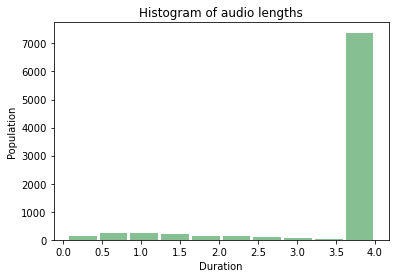

Greater than 3 seconds: 7468
Lower than 3 seconds: 1264
Lower than 1.5 seconds: 785


In [5]:
plt.hist(audiodatadf['duration'], rwidth=0.9, color='#86bf91')

plt.xlabel('Duration')
plt.ylabel('Population')
plt.title('Histogram of audio lengths')
plt.grid(False)
plt.show()

# Count samples with duration > 3 sec
gt_3sec = audiodatadf['duration'][audiodatadf['duration'] > 3].count()
lt_3sec = audiodatadf['duration'][audiodatadf['duration'] < 3].count()
lt_15sec = audiodatadf['duration'][audiodatadf['duration'] < 1.5].count()

# Display counts of interest
print("Greater than 3 seconds: {}".format(gt_3sec))
print("Lower than 3 seconds: {}".format(lt_3sec))
print("Lower than 1.5 seconds: {}".format(lt_15sec))

Most samples have a duration greater than 3 seconds. Only the ~14.4% of the dataset has less than 3 seconds and ~8.5% is lower than 1.5 seconds.<br/>
<br/>

##### Preserving Spatial Size
A CNN model will require input vectors of equal size. The way to achieve this with a dataset of varying durations is by using padding (filling up empty space with zeros). This is a very common technique and it does not affect the capability of the filters to recognize patterns, with no effect on classification performance:

From the Stanford lectures on Conv Nets (cs231n):<br/>

"*In addition to the aforementioned benefit of keeping the spatial sizes constant after CONV, doing this actually improves performance. If the CONV layers were to not zero-pad the inputs and only perform valid convolutions, then the size of the volumes would reduce by a small amount after each CONV, and the information at the borders would be “washed away” too quickly.*"

<br/>

#### 3.2.2 Audio Channels

In [6]:
print(audiodatadf.channels.value_counts(normalize=True))

2    0.915369
1    0.084631
Name: channels, dtype: float64


Most files (>91%) are Stereo (two separated channels). This is not a problem, channel mixing is a very common technique in digital audio processing. We are going to mix stereo channels into a mono mix and work with single channel audio.

<br/>

#### 3.2.3 Bith depth

In [7]:
print("Bit depths:\n")
print(audiodatadf.bit_depth.value_counts(normalize=True))

Bit depths:

16    0.659414
24    0.315277
32    0.019354
8     0.004924
4     0.001031
Name: bit_depth, dtype: float64


Found samples from 4bit to 32bit. The difference in audio quality between 4bit and 32bit is extreme.

A a rough reference:
* 32bit / 24bit audio: used for professional audio recording.
* 16bit audio: CD playback, most quality streaming playback.
* 8bit / 4bit: old gaming audio quality, nowadays sampling to this is used to 'destroy' audio as an artistic effect.

<br/>

Different bit depths means different scales and shapes in our data. This is another property that requires normalization.

#### 3.2.4 Sample Rates

In [8]:
print("Sample rates:\n")
print(audiodatadf.sample_rate.value_counts(normalize=True))

Sample rates:

44100     0.614979
48000     0.286532
96000     0.069858
24000     0.009391
16000     0.005153
22050     0.005039
11025     0.004466
192000    0.001947
8000      0.001374
11024     0.000802
32000     0.000458
Name: sample_rate, dtype: float64


We have samples between 8khz and 192khz. In terms of audio quality there is a huge difference between 8khz and 192khz, although, at some point the difference is hardly noticeable by the human ear. 

A rough reference:
* 96khz - 192khz: common sample rates in professional audio recording.
* 44.1khz - 48khz: common sample rates in audio playback (CD/DVD/Streaming).
* 22.05khz: low quality sample rates, common in low bandwidth streaming.
* 8khz - 11khz: extremely low quality sample rates.

<br/>

#### 3.3 Conclusion

The dataset is not fully balanced in means of classes, with two classes containing less than then 50% of the mean per-class count of the dataset. This may or may not be a problem depending on the complexity of the patterns that describe the occurrences belonging to those classes. If it shows to be a problem we can try using class weights or over-sampling particular classes with augmented data.<br/>
<br/>
Having a dataset with this variance in terms of digital audio properties can be a problem as low quality samples have less information, and most importantly, because during the conversion process some audio data is always lost.
Maybe this is one reasons why researchers rarely reach over **83%** of accuracy with this dataset, and easily over **90%** with other more balanced datasets like **EC-50** and **EC-10**.<br/>
<br/>
<br/>

## 4. Listening to the data

We'll listen to some random samples per class while we also examine the digital audio properties of each case. I recommend you to use some acceptable sound speakers/headphones.<br/>
<br/>
Can you appreciate the difference between different sample rates? Can you still recognize sounds when the sample rate is too low? Do you distinguish any difference between the lowest and highest sample rates and bit-depths?<br/>
<br/>
If you cannot reproduce some of this files it may mean you need to install missing audio codecs in your system. Make sure to check for audio codec packs for your operating system.<br/>
<br/>
(Press Ctrl + Enter to re-randomize the sound on each cell) <br/>
<br/>
<br/>

#### Children playing

In [11]:
row = audiodatadf[audiodatadf['class'] == 'children_playing'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: children_playing
File: d:\Github\urban-audio-classifier\UrbanSound8K\audio\fold8\142003-2-0-19.wav
Sample rate: 48000
Bit depth: 16
Duration 4.0 seconds


#### Engine idling

In [12]:
row = audiodatadf[audiodatadf['class'] == 'engine_idling'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: engine_idling
File: d:\Github\urban-audio-classifier\UrbanSound8K\audio\fold3\144068-5-4-0.wav
Sample rate: 48000
Bit depth: 24
Duration 4.0 seconds


#### Street music

In [54]:
row = audiodatadf[audiodatadf['class'] == 'street_music'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: street_music
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold6/99710-9-0-5.wav
Sample rate: 44100
Bit depth: 16
Duration 4.0 seconds


#### Jackhammer

In [55]:
row = audiodatadf[audiodatadf['class'] == 'jackhammer'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: jackhammer
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold10/162134-7-10-3.wav
Sample rate: 96000
Bit depth: 24
Duration 4.0 seconds


#### Air conditioner

In [56]:
row = audiodatadf[audiodatadf['class'] == 'air_conditioner'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: air_conditioner
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold3/146714-0-0-12.wav
Sample rate: 44100
Bit depth: 24
Duration 4.0 seconds


#### Drilling

In [57]:
row = audiodatadf[audiodatadf['class'] == 'drilling'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: drilling
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold3/69598-4-8-0.wav
Sample rate: 44100
Bit depth: 16
Duration 2.143088000000006 seconds


#### Dog bark

In [58]:
row = audiodatadf[audiodatadf['class'] == 'dog_bark'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: dog_bark
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold3/63292-3-0-0.wav
Sample rate: 44100
Bit depth: 16
Duration 4.0 seconds


#### Siren

In [59]:
row = audiodatadf[audiodatadf['class'] == 'siren'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: siren
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold7/105289-8-2-1.wav
Sample rate: 44100
Bit depth: 16
Duration 4.0 seconds


#### Car horn

In [60]:
row = audiodatadf[audiodatadf['class'] == 'car_horn'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: car_horn
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold7/153057-1-0-0.wav
Sample rate: 44100
Bit depth: 16
Duration 1.0990450000000003 seconds


#### Gun shot

In [64]:
row = audiodatadf[audiodatadf['class'] == 'gun_shot'].sample(1)
helpers.play_dataset_sample(row, audio_path)

Class: gun_shot
File: /home/edu/Projects/urban-audio-classifier/UrbanSound8K/audio/fold4/135528-6-6-0.wav
Sample rate: 44100
Bit depth: 16
Duration 2.007719999999992 seconds


## 5. Conclusions

We found a wide variation range on every digital audio property, including many samples of extremely low quality audio. To work with consistent data we must normalize this by converting all the audio data files to the same format, although this may also introduce a new possible problem: the loss of audio data by the conversion process.<br/>

#### To filtering or not to filter
Commonly, converting between extremely different sample rates will end in audio degradation (like "Aliasing") and in the loss of audible frequencies. If you have experience working with audio it is very possible that you would think that very low/high audio quality samples should be filtered from the dataset.<br/>
<br/>
On the other hand, while working with prediction models we commonly end up looking for different ways to introduce noise into the model to achieve a regularization effect (to avoid overfitting and contribute to better generalization), and thus, artifacts introduced by the conversion process may very well work for this purpose.<br/>
We'll find out later that despite the extremely bad quality (noisy and with unnatural performance) of 4 and 8 bit samples, these audio samples will still contain recognizable sound patterns for our model to learn. And while it is true that previous works with this dataset usually tend to achieve lower scores than with other datasets (Like the EC-50), I got much better results with the full dataset than with a filtered dataset. In conclusion, I'm not going to filter the data for this project.<br/>

#### How to normalize the dataset in terms of audio properties
The only answer is conversion. We can convert all the files to the same audio format/codec and work with the converted dataset or we may convert files on load time.<br/>
<br/>
My first attempt was to use 'ffmpeg' for fast conversions (compared to conversors in native Python libraries). But as we'll see on the next notebook on data pre-processing, some of those "slow" native Python libraries will give us simplified interfaces to robust data conversion and accurate feature extraction that will be worth the processing time difference.<br/>
<br/>
<br/>

## 6. Next

On the next notebook we'll work on audio conversion and evaluate common features that can be generated from an audio signal, from spectrogram, STFT, MFCC and Mel spectrogram and decide which one to use to feed our network for training and prediction.<br/>
<br/>